In [1]:
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint, LearningRateMonitor
from pytorch_lightning.loggers import CSVLogger
import segmentation_models_pytorch as smp
from datasets import load_dataset
from torchvision.transforms import v2
from collections import defaultdict
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import cv2
import glob
from PIL import Image
from scipy.ndimage import distance_transform_edt

pl.seed_everything(42)

Seed set to 42


42

In [2]:
def sprinkles(
    img,
    size,
    perc,
    channels=3,
    mode="random",
    width=2,
    pattern_path="fence_pattern.png",
    mask_dataset_path="dataset/Training Set/Training_Labels",
    dilation_kernel_size=3,
    background_weight=0.1,
    normalize_weights=True,
):
    """
    img: torch.Tensor of shape (C, H, W), values in [0, 1]
    mode: "random" | "grid" | "diagonals" | "pattern" | "dataset_mask"
    size:
        - random: sprinkle square size
        - grid/diagonals: spacing between lines
        - pattern/dataset_mask: ignored
    perc:
        - random: percentage of pixels to affect
        - grid/diagonals/pattern/dataset_mask: ignored (kept for API consistency)
    width: line thickness for grid/diagonals
    pattern_path: path to the fence pattern image (for mode="pattern")
    mask_dataset_path: path to the mask dataset folder (for mode="dataset_mask")
    dilation_kernel_size: kernel size for morphological dilation (for mode="dataset_mask")
    """
    x = img.clone()
    C, H, W = x.shape
    mask = torch.zeros((1, H, W), dtype=torch.float32)
    
    # RANDOM (original behavior)
    if mode == "random":
        number_of_pixels_to_change = int(perc * H * W)
        number_of_sprinkles = max(1, number_of_pixels_to_change // (size * size))
        for _ in range(number_of_sprinkles):
            y = torch.randint(0, H - size, (1,)).item()
            x0 = torch.randint(0, W - size, (1,)).item()
            x[:, y:y + size, x0:x0 + size] = 0.0
            mask[:, y:y + size, x0:x0 + size] = 1.0
    
    # GRID (vertical + horizontal lines)
    elif mode == "grid":
        for y in range(0, H, size):
            y_end = min(y + width, H)
            x[:, y:y_end, :] = 0.0
            mask[:, y:y_end, :] = 1.0
        for x0 in range(0, W, size):
            x_end = min(x0 + width, W)
            x[:, :, x0:x_end] = 0.0
            mask[:, :, x0:x_end] = 1.0
    
    # DIAGONALS (both directions)
    elif mode == "diagonals":
        for offset in range(-H, W, size):
            for w in range(width):
                # main diagonal \
                y = torch.arange(H)
                x_diag = y + offset + w
                valid = (x_diag >= 0) & (x_diag < W)
                x[:, y[valid], x_diag[valid]] = 0.0
                mask[:, y[valid], x_diag[valid]] = 1.0
                # anti-diagonal /
                x_anti = (W - 1 - y) + offset + w
                valid = (x_anti >= 0) & (x_anti < W)
                x[:, y[valid], x_anti[valid]] = 0.0
                mask[:, y[valid], x_anti[valid]] = 1.0
    
    # PATTERN (load from image file)
    elif mode == "pattern":
        # Load the pattern image
        if not os.path.exists(pattern_path):
            raise FileNotFoundError(f"Pattern image not found: {pattern_path}")
        
        pattern_img = Image.open(pattern_path).convert("L")  # Convert to grayscale
        pattern_img = pattern_img.resize((W, H), Image.NEAREST)  # Resize to match image
        
        # Convert to tensor and normalize
        pattern_array = np.array(pattern_img, dtype=np.float32) / 255.0
        pattern_tensor = torch.from_numpy(pattern_array).unsqueeze(0)  # [1, H, W]
        
        # Binarize the pattern (threshold at 0.5)
        mask = (pattern_tensor > 0.5).float()
        
        # Apply mask to image (zero out where mask is 1)
        x = x * (1 - mask)
    
    # DATASET_MASK (load random mask from dataset)
    elif mode == "dataset_mask":
        # Get all mask files from the dataset
        if not os.path.exists(mask_dataset_path):
            raise FileNotFoundError(f"Mask dataset path not found: {mask_dataset_path}")
        
        mask_files = glob.glob(os.path.join(mask_dataset_path, "*.png")) + \
                     glob.glob(os.path.join(mask_dataset_path, "*.jpg")) + \
                     glob.glob(os.path.join(mask_dataset_path, "*.jpeg"))
        
        if len(mask_files) == 0:
            raise FileNotFoundError(f"No mask images found in: {mask_dataset_path}")
        
        # Randomly select a mask file
        random_mask_path = np.random.choice(mask_files)
        
        # Load the mask image
        mask_img = Image.open(random_mask_path).convert("L")  # Convert to grayscale
        mask_array = np.array(mask_img, dtype=np.float32) / 255.0
        
        # Get mask dimensions
        mask_h, mask_w = mask_array.shape
        
        # Strategy: Random crop or resize based on relative sizes
        
        mask_img_resized = mask_img.resize((W, H), Image.BILINEAR)
        mask_array = np.array(mask_img_resized, dtype=np.float32) / 255.0
        
        # Apply dilation to thicken the mask lines
        if dilation_kernel_size > 0:
            kernel = cv2.getStructuringElement(
                cv2.MORPH_ELLIPSE, 
                (dilation_kernel_size, dilation_kernel_size)
            )
            mask_array = cv2.dilate(mask_array, kernel, iterations=1)
        
        # Convert to tensor
        mask_tensor = torch.from_numpy(mask_array).unsqueeze(0)  # [1, H, W]
        
        # Binarize the mask (threshold at 0.5)
        mask = (mask_tensor > 0.5).float()
        
        # Apply mask to image (zero out where mask is 1)
        x = x * (1 - mask)
    
    else:
        raise ValueError(f"Unknown mode: {mode}")
        
    weights = torch.full((1, H, W), background_weight, dtype=torch.float32)
    mask_np = mask[0].numpy().astype(bool)
    
    if mask_np.any():  # Solo si hay áreas afectadas
        # Distance transform: calcula distancia al borde más cercano
        # Para las áreas enmascaradas (True), da valores más altos en el centro
        distances = distance_transform_edt(mask_np)
        distances = torch.from_numpy(distances).float().unsqueeze(0)
        
        # Normalizar distancias si se requiere
        if normalize_weights and distances.max() > 0:
            distances = distances / distances.max()
        
        # Aplicar las distancias solo donde hay mask
        weights = torch.where(mask > 0, distances, weights)

    
    return x, img, mask, weights

In [3]:
class HFImageDataset(Dataset):
    def __init__(self, hf_dataset, transforms=None, sprinkles_mode='mixed'):
        self.dataset = hf_dataset
        self.transforms = transforms
        self.sprinkles_mode = sprinkles_mode
        self.modes = ['random', 'grid', 'diagonals', 'dataset_mask']
    
    def __len__(self): return len(self.dataset)
    
    def __getitem__(self, idx):
        image = self.dataset[idx]['image']
        if self.transforms: image = self.transforms(image)
        # Seleccionar modo aleatorio si es mixed
        mode = np.random.choice(self.modes) if self.sprinkles_mode == 'mixed' else self.sprinkles_mode
        masked, original, mask, weights = sprinkles(image, size=10, perc=0.15, mode=mode)
        return {'masked_image': masked, 'original_image': original, 'mask': mask, 'weights': weights}

class DataModule(pl.LightningDataModule):
    def __init__(self, dataset_name, bs=32, sprinkles_mode='mixed'):
        super().__init__()
        self.dataset_name = dataset_name
        self.bs = bs
        self.sprinkles_mode = sprinkles_mode

    def setup(self, stage=None):
        ds = load_dataset(self.dataset_name)['train']
        train_size = int(0.85 * len(ds))
        train_data, val_data = random_split(ds, [train_size, len(ds) - train_size])
        
        # Pipeline de Augmentation (Training)
        self.train_aug = v2.Compose([
            v2.ToImage(), v2.Resize(256), v2.CenterCrop(224),
            v2.RandomHorizontalFlip(p=0.5),
            v2.ColorJitter(brightness=0.2, contrast=0.2),
            v2.ToDtype(torch.float32, scale=True),
            v2.Normalize(mean=[0.344, 0.380, 0.407], std=[0.202, 0.136, 0.115])
        ])
        
        # Pipeline de Test (Sin aleatoriedad)
        self.test_transforms = v2.Compose([
            v2.ToImage(), v2.Resize(256), v2.CenterCrop(224),
            v2.ToDtype(torch.float32, scale=True),
            v2.Normalize(mean=[0.344, 0.380, 0.407], std=[0.202, 0.136, 0.115])
        ])
        
        self.train_ds = HFImageDataset(train_data, transforms=self.train_aug, sprinkles_mode=self.sprinkles_mode)
        self.valid_ds = HFImageDataset(val_data, transforms=self.test_transforms, sprinkles_mode=self.sprinkles_mode)

    def train_dataloader(self): return DataLoader(self.train_ds, batch_size=self.bs, shuffle=True, num_workers=4)
    def val_dataloader(self): return DataLoader(self.valid_ds, batch_size=self.bs, num_workers=4)

In [4]:
class LightningModule(pl.LightningModule):
    def __init__(self, learning_rate=3e-4):
        super().__init__()
        self.save_hyperparameters()
        # 4 canales de entrada (RGB + Máscara)
        self.model = smp.Unet(encoder_name='resnet50', encoder_weights='imagenet', in_channels=4, classes=3)
        self.training_step_outputs = defaultdict(float)
        self.validation_step_outputs = defaultdict(float)
        
    def forward(self, x): return self.model(x)

    def _shared_step(self, batch):
        x_img, y, mask, weights = batch['masked_image'], batch['original_image'], batch['mask'], batch['weights']
        # Concatenar imagen y máscara
        x_input = torch.cat([x_img, mask], dim=1)
        y_hat = self(x_input)
        
        # Weighted L1 Loss: penaliza más el error donde la valla es gruesa
        loss_pixel = F.l1_loss(y_hat, y, reduction='none')
        loss = (loss_pixel * weights.expand_as(loss_pixel)).sum() / (weights.sum() + 1e-8)
        return loss

    def training_step(self, batch, batch_idx):
        loss = self._shared_step(batch)
        self.log('train_loss', loss, on_epoch=True, prog_bar=True)
        self.training_step_outputs['loss'] += loss.detach().cpu(); self.training_step_outputs['steps'] += 1
        return loss
    
    def validation_step(self, batch, batch_idx):
        loss = self._shared_step(batch)
        self.log('val_loss', loss, on_epoch=True, prog_bar=True)
        self.validation_step_outputs['loss'] += loss.detach().cpu(); self.validation_step_outputs['steps'] += 1
        return loss

    def configure_optimizers(self):
        opt = torch.optim.Adam(self.parameters(), lr=self.hparams.learning_rate)
        sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.5, patience=5)
        return {"optimizer": opt, "lr_scheduler": {"scheduler": sch, "monitor": "val_loss"}}

In [5]:
# Setup
dm = DataModule(dataset_name="urbanstevie/reference_dataset", bs=32, sprinkles_mode="mixed")
model = LightningModule(learning_rate=3e-4)

# Callbacks profesionales
checkpoint_cb = ModelCheckpoint(
    monitor='val_loss', mode='min', 
    filename='best-inpainting-{epoch:02d}-{val_loss:.4f}', 
    save_top_k=3
)
early_stop = EarlyStopping(monitor='val_loss', patience=15, min_delta=0.0005)
lr_mon = LearningRateMonitor(logging_interval='epoch')

# Trainer
trainer = pl.Trainer(
    max_epochs=100, 
    logger=CSVLogger(os.getcwd(), name="augmentation_mix"),
    callbacks=[checkpoint_cb, early_stop, lr_mon],
    gradient_clip_val=1.0,
    accelerator="auto"
)

# Ejecutar entrenamiento
trainer.fit(model, dm)

print(f"Mejor modelo guardado en: {checkpoint_cb.best_model_path}")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
Repo card metadata block was not found. Setting CardData to empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params | Mode 
---------------------------------------
0 | model | Unet | 32.5 M | train
---------------------------------------
32.5 M    Trainable params
0         Non-trainable params
32.5 M    Total params
130.098   Total estimated model params size (MB)
223       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Mejor modelo guardado en: /home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/augmentation_mix/version_0/checkpoints/best-inpainting-epoch=70-val_loss=0.6404.ckpt


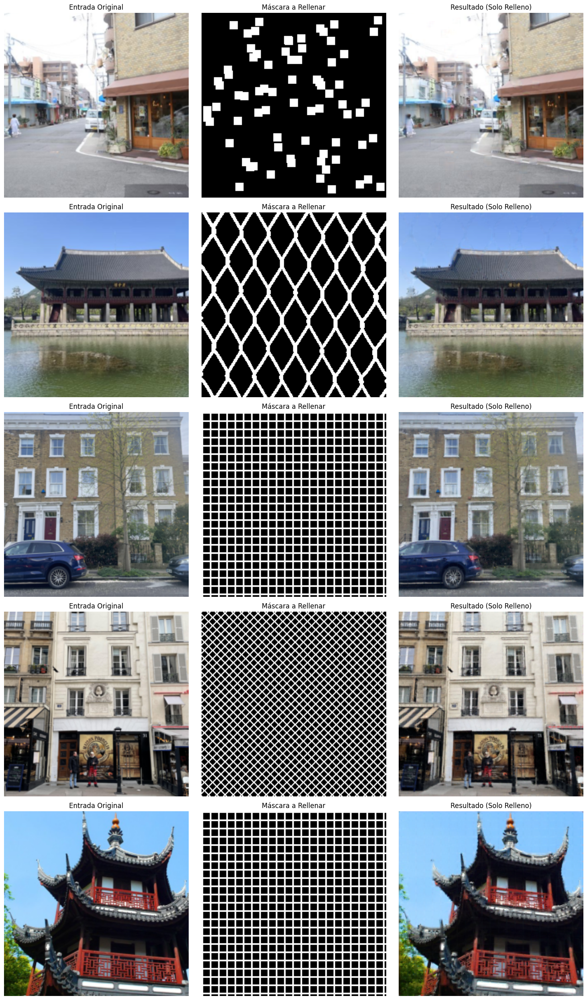

In [6]:
def denormalize(img):
    mean = torch.tensor([0.344, 0.380, 0.407]).view(3, 1, 1)
    std = torch.tensor([0.202, 0.136, 0.115]).view(3, 1, 1)
    return torch.clamp(img * std + mean, 0, 1)

def visualize_final_results(model, dataloader, num_images=5):
    model.eval()
    device = next(model.parameters()).device
    batch = next(iter(dataloader))
    
    x_img = batch['masked_image'][:num_images].to(device)
    y_real = batch['original_image'][:num_images].to(device)
    mask = batch['mask'][:num_images].to(device)
    
    with torch.no_grad():
        y_pred = model(torch.cat([x_img, mask], dim=1))
    
    # MEZCLA FINAL: Original donde no hay máscara + Predicción donde hay máscara
    composed = y_real * (1 - mask) + y_pred * mask
    
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5*num_images))
    for i in range(num_images):
        axes[i, 0].imshow(denormalize(y_real[i].cpu()).permute(1, 2, 0))
        axes[i, 0].set_title("Entrada Original")
        axes[i, 1].imshow(mask[i, 0].cpu(), cmap='gray')
        axes[i, 1].set_title("Máscara a Rellenar")
        axes[i, 2].imshow(denormalize(composed[i].cpu()).permute(1, 2, 0))
        axes[i, 2].set_title("Resultado (Solo Relleno)")
        for ax in axes[i]: ax.axis('off')
    plt.tight_layout()
    plt.show()

# Ejecutar visualización con el mejor modelo cargado
visualize_final_results(model, dm.val_dataloader())

In [9]:
# Load the best model
model = LightningModule.load_from_checkpoint(checkpoint_cb.best_model_path)
model.cuda(0) # Move to GPU
model.eval()

LightningModule(
  (model): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(4, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReL

In [12]:
import cv2
from skimage.morphology import dilation as sk_dilation
from skimage.morphology import disk

class DefencingInferenceDataset(Dataset):
    def __init__(self, images_dir, labels_dir, transforms=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.transforms = transforms
        self.image_files = sorted([f for f in os.listdir(images_dir) if f.lower().endswith(".jpg")])
    
    def __len__(self): return len(self.image_files)
    
    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        base_name = os.path.splitext(img_name)[0]
        
        # Cargar imagen real y máscara
        image_pil = Image.open(os.path.join(self.images_dir, img_name)).convert("RGB")
        mask_pil = Image.open(os.path.join(self.labels_dir, base_name + ".png")).convert("L")
        
        # Aplicar transforms (Resize a 256, Crop a 224, Normalize)
        if self.transforms:
            # Importante: para v2, pasamos ambos para que el crop sea idéntico
            image_t, mask_t = self.transforms(image_pil, mask_pil)

        # Convertir máscara a numpy para dilatación con OpenCV (más estable)
        # mask_t es [1, 224, 224]
        mask_np = mask_t[0].numpy() 
        
        # Dilatación con OpenCV: Kernel circular de 5x5 (equivale a radio 2-3)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
        mask_dilated = cv2.dilate(mask_np, kernel, iterations=1)
        
        # Convertir de nuevo a tensor [1, 224, 224]
        mask_final = torch.from_numpy(mask_dilated).unsqueeze(0).float()
        mask_final = (mask_final > 0.5).float() # Binarizar
        
        # Preparar entrada para el modelo (Imagen con valla en negro)
        masked_input = image_t * (1 - mask_final)
        
        return {
            'masked_image': masked_input, 
            'original_image': image_t, 
            'mask': mask_final,
            'filename': img_name
        }

# DataModule de Inferencia
# Reutilizamos los test_transforms del entrenamiento (Resize 256 -> Crop 224 -> Normalize)
inference_ds = DefencingInferenceDataset(
    images_dir="dataset/Test Set/Test_Images",
    labels_dir="dataset/Test Set/Test_Labels",
    transforms=dm.test_transforms
)

inference_loader = DataLoader(inference_ds, batch_size=8, shuffle=False)

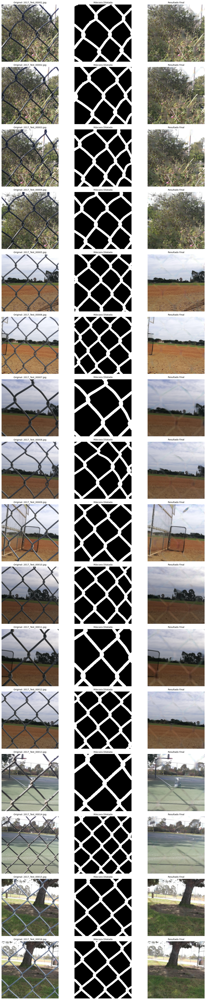

In [16]:
def run_defencing_inference(model, dataloader, num_images=16):
    model.eval()
    device = next(model.parameters()).device
    
    all_originals = []
    all_masks = []
    all_results = []
    all_filenames = []
    
    # Acumular imágenes hasta llegar a num_images
    with torch.no_grad():
        for batch in dataloader:
            x_masked = batch['masked_image'].to(device)
            y_real = batch['original_image'].to(device)
            mask = batch['mask'].to(device)
            filenames = batch['filename']
            
            # Predicción 4-canales
            y_pred = model(torch.cat([x_masked, mask], dim=1))
            
            # Blending: Solo rellenar la zona de la máscara
            final_output = y_real * (1 - mask) + y_pred * mask
            
            # Guardar resultados
            all_originals.append(y_real.cpu())
            all_masks.append(mask.cpu())
            all_results.append(final_output.cpu())
            all_filenames.extend(filenames)
            
            if len(all_filenames) >= num_images:
                break

    # Concatenar todo
    y_real_all = torch.cat(all_originals, dim=0)[:num_images]
    mask_all = torch.cat(all_masks, dim=0)[:num_images]
    final_all = torch.cat(all_results, dim=0)[:num_images]

    # Visualización en cuadrícula
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 4 * num_images))
    
    for i in range(num_images):
        img_ori = denormalize(y_real_all[i]).permute(1, 2, 0).numpy()
        img_mask = mask_all[i, 0].numpy()
        img_res = denormalize(final_all[i]).permute(1, 2, 0).numpy()
        
        axes[i, 0].imshow(img_ori)
        axes[i, 0].set_title(f"Original: {all_filenames[i]}", fontsize=10)
        
        axes[i, 1].imshow(img_mask, cmap='gray')
        axes[i, 1].set_title("Máscara Dilatada", fontsize=10)
        
        axes[i, 2].imshow(img_res)
        axes[i, 2].set_title("Resultado Final", fontsize=10)
        
        for ax in axes[i]: ax.axis('off')

    plt.tight_layout()
    plt.show()

# Ejecutar para 16 imágenes
run_defencing_inference(model, inference_loader, num_images=16)